In [1]:
#installing required libraries

!pip install numpy
!pip install kmodes
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install scipy

In [1]:
#importing required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.api.types import is_numeric_dtype
from sklearn.cluster import KMeans
import plotly.express as px
import plotly.graph_objects as go
from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes
from sklearn.decomposition import PCA
from IPython.display import clear_output

In [2]:
#reading in the data table, dropping extra column, and NaN values

df = pd.read_csv('/Users/akanksharoy/Downloads/data.csv')
df = df.drop(['Column1','index','Date','Year'], axis=1).dropna()
df.head()

,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue
0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,1.0,80.00,109.000000,80.0,109.0
1,February,29.0,F,United States,Washington,Clothing,Gloves,2.0,24.50,28.500000,49.0,57.0
2,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,3.67,5.000000,11.0,15.0
3,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,2.0,87.50,116.500000,175.0,233.0
4,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,35.00,41.666667,105.0,125.0


In [3]:
#creating a table with all the numerical data, and describing it

df_num = df[["Customer Age", "Quantity","Unit Cost","Unit Price","Cost","Revenue"]]
numerical_stats = df_num.describe()
print(numerical_stats)

       Customer Age      Quantity     Unit Cost    Unit Price          Cost  \
count  34866.000000  34866.000000  34866.000000  34866.000000  34866.000000   
mean      36.382895      2.002524    349.880567    389.232485    576.004532   
std       11.112902      0.813936    490.015846    525.319091    690.500395   
min       17.000000      1.000000      0.670000      0.666667      2.000000   
25%       28.000000      1.000000     45.000000     53.666667     85.000000   
50%       35.000000      2.000000    150.000000    179.000000    261.000000   
75%       44.000000      3.000000    455.000000    521.000000    769.000000   
max       87.000000      3.000000   3240.000000   5082.000000   3600.000000   

            Revenue  
count  34866.000000  
mean     640.870074  
std      736.650597  
min        2.000000  
25%      102.000000  
50%      319.000000  
75%      902.000000  
max     5082.000000  


In [4]:
#creating a table with all the categorical data, and describing it

df_cat = df[["Month","Customer Gender","Country","State","Product Category","Sub Category"]]
categorical_stats = df_cat.describe()
print(categorical_stats)
df_cat.head()

        Month Customer Gender        Country       State Product Category  \
count   34866           34866          34866       34866            34866   
unique     12               2              4          45                3   
top      June               M  United States  California      Accessories   
freq     3680           17805          18076       10332            22534   

           Sub Category  
count             34866  
unique               17  
top     Tires and Tubes  
freq              11112  


,Month,Customer Gender,Country,State,Product Category,Sub Category
0,February,F,United States,Washington,Accessories,Tires and Tubes
1,February,F,United States,Washington,Clothing,Gloves
2,February,F,United States,Washington,Accessories,Tires and Tubes
3,March,F,United States,Washington,Accessories,Tires and Tubes
4,March,F,United States,Washington,Accessories,Tires and Tubes


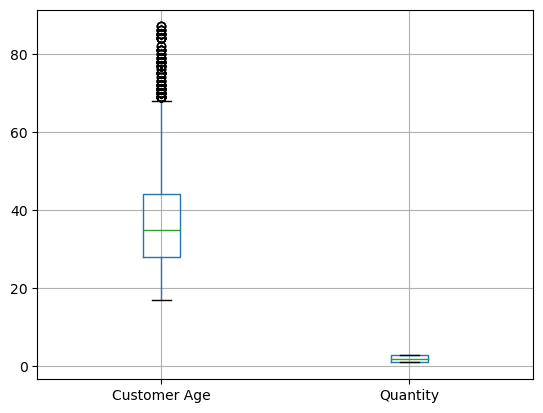

In [5]:
#boxplot of Customer Age and Quantity

boxplot = df.boxplot(column=["Customer Age", "Quantity"])
plt.show()

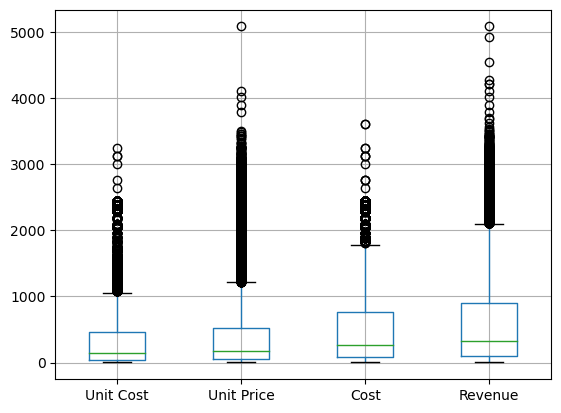

In [6]:
#boxplot of Unit Cost, Unit Price, Cost, and Revenue

boxplot = df.boxplot(column=["Unit Cost","Unit Price","Cost","Revenue"])
plt.show()

/var/folders/dt/mfk7l6kj25l9zm6v998pp24m0000gn/T/ipykernel_60585/4015845916.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_num.loc[df_num[col] < tenth, col] = tenth
/var/folders/dt/mfk7l6kj25l9zm6v998pp24m0000gn/T/ipykernel_60585/4015845916.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_num.loc[df_num[col] > nineth, col] = nineth


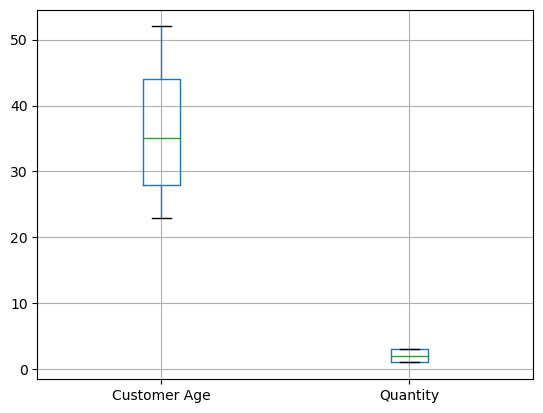

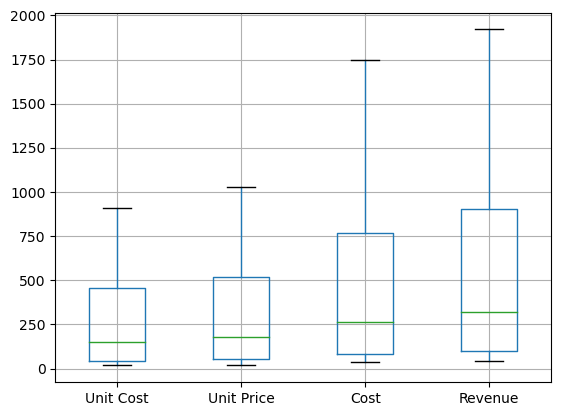

In [7]:
# Computing 10th, 90th percentiles and replacing the outliers for all the numerical data
#Recreating the boxplots from above

percentiles = pd.DataFrame()
ten_percentiles = {}
ninety_percentiles = {}
for col in list(df_num):
    ten_percentiles[col] = np.percentile(df_num.loc[:,col],10,axis=0)
    ninety_percentiles[col] = np.percentile(df_num.loc[:,col],90,axis=0)
    percentiles[col] = [ten_percentiles[col],ninety_percentiles[col]]

percentiles.head()

for col in list(df_num):
    tenth = percentiles[col].loc[percentiles.index[0]]
    nineth = percentiles[col].loc[percentiles.index[1]]
    vals = list(df_num.loc[:,col])
    for val in vals:
        df_num.loc[df_num[col] < tenth, col] = tenth
        df_num.loc[df_num[col] > nineth, col] = nineth
        
boxplot = df_num.boxplot(column=["Customer Age", "Quantity"])
plt.show()

boxplot = df_num.boxplot(column=["Unit Cost","Unit Price","Cost","Revenue"])
plt.show()
        
# print(tenth_percentile, ninetieth_percentile)b =
#np.where(sample<tenth_percentile, tenth_percentile, sample)
#b = np.where(b>ninetieth_percentile, ninetieth_percentile, b)
# print(“Sample:”, sample)
#print(“New array:”,b)

/var/folders/dt/mfk7l6kj25l9zm6v998pp24m0000gn/T/ipykernel_60585/1083386350.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cat["Month encode"] = df_cat["Month"].apply(lambda x : fq[x])


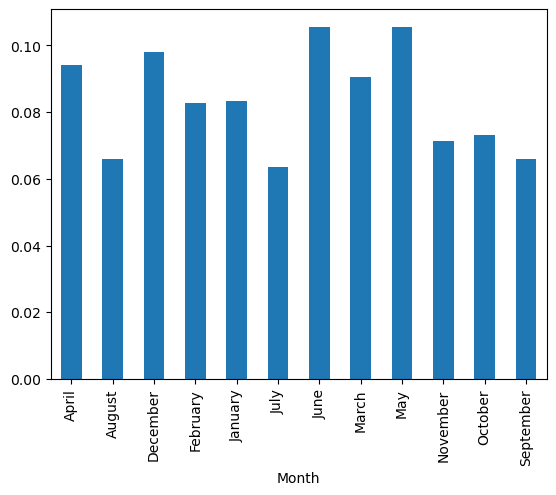

In [8]:
#Visualizing the frequency of Month

fq = (df_cat.groupby("Month").size()) / len(df_cat)
df_cat["Month encode"] = df_cat["Month"].apply(lambda x : fq[x])
df_cat.head()
df_cat = df_cat.drop(['Month'], axis=1)
fq.plot.bar(stacked=True)
plt.show()

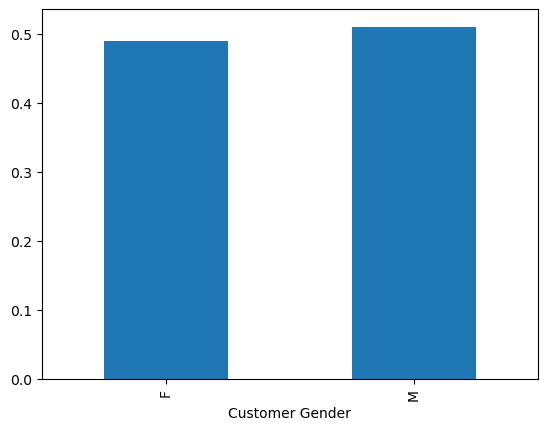

In [9]:
#Visualizing the frequency of Customer Gender

fq = (df_cat.groupby("Customer Gender").size()) / len(df_cat)
df_cat["Customer Gender encode"] = df_cat["Customer Gender"].apply(lambda x : fq[x])
df_cat.head()
df_cat = df_cat.drop(['Customer Gender'], axis=1)
fq.plot.bar(stacked=True)
plt.show()

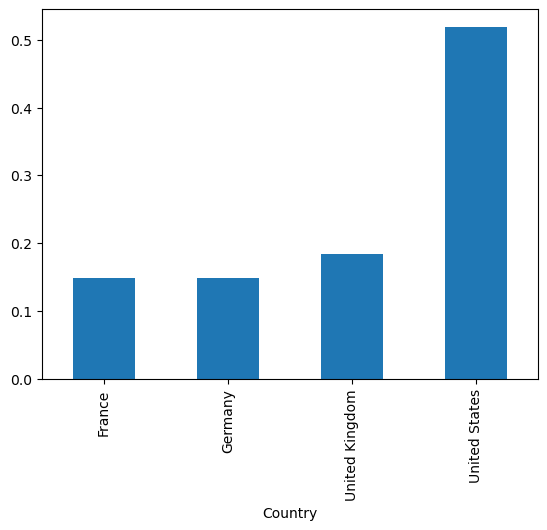

In [10]:
#Visualizing the frequency of Country

fq = (df_cat.groupby("Country").size()) / len(df_cat)
df_cat["Country encode"] = df_cat["Country"].apply(lambda x : fq[x])
df_cat.head()
df_cat = df_cat.drop(['Country'], axis=1)
fq.plot.bar(stacked=True)
plt.show()

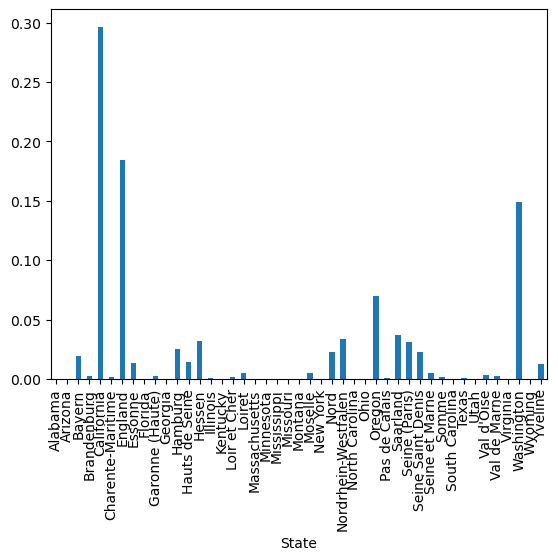

In [11]:
#Visualizing the frequency of State

fq = (df_cat.groupby("State").size()) / len(df_cat)
df_cat["State encode"] = df_cat["State"].apply(lambda x : fq[x])
df_cat.head()
df_cat = df_cat.drop(['State'], axis=1)
fq.plot.bar(stacked=True)
plt.show()

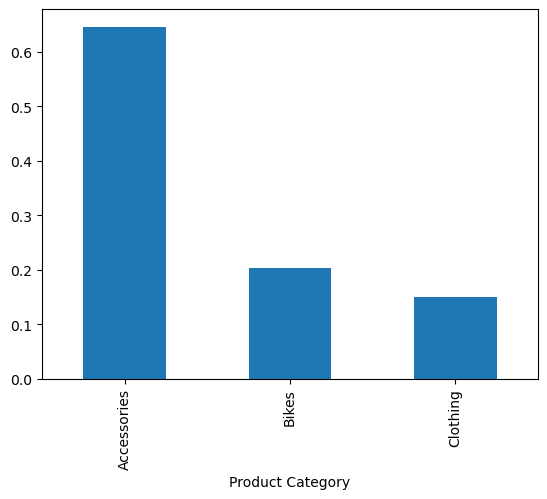

In [12]:
#Visualizing the frequency of Product Category

fq = (df_cat.groupby("Product Category").size()) / len(df_cat)
df_cat["Product Category encode"] = df_cat["Product Category"].apply(lambda x : fq[x])
df_cat.head()
df_cat = df_cat.drop(['Product Category'], axis=1)
fq.plot.bar(stacked=True)
plt.show()

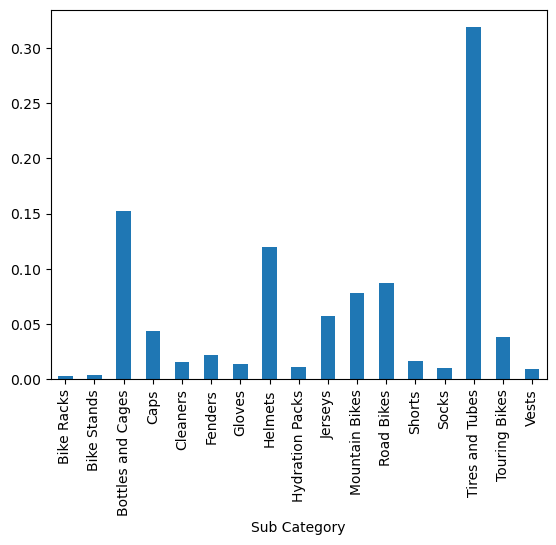

In [13]:
#Visualizing the frequency of (Product) Sub Category

fq = (df_cat.groupby("Sub Category").size()) / len(df_cat)
df_cat["Sub Category encode"] = df_cat["Sub Category"].apply(lambda x : fq[x])
df_cat.head()
df_cat = df_cat.drop(['Sub Category'], axis=1)
fq.plot.bar(stacked=True)
plt.show()

In [14]:
#training a kmeans model on Customer Age and Revenue

kmeans_model = KMeans(init='k-means++',  max_iter=400, random_state=42)
kmeans_model.fit(df[['Customer Age','Revenue']])

/Users/akanksharoy/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(max_iter=400, random_state=42)

In [17]:
#Finding the optimal number of clusters

def try_different_clusters(K, data):

    cluster_values = list(range(1, K+1))
    inertias=[]

    for c in cluster_values:
        model = KMeans(n_clusters = c,init='k-means++',max_iter=400,random_state=42)
        model.fit(data)
        inertias.append(model.inertia_)

    return inertias

outputs = try_different_clusters(12, df[['Customer Age','Revenue']])
distances = pd.DataFrame({"clusters": list(range(1, 13)),"sum of squared distances": outputs})

figure = go.Figure()
figure.add_trace(go.Scatter(x=distances["clusters"], y=distances["sum of squared distances"]))

figure.update_layout(xaxis = dict(tick0 = 1,dtick = 1,tickmode = 'linear'),
                  xaxis_title="Number of clusters",
                  yaxis_title="Sum of squared distances",
                  title_text="Finding optimal number of clusters using elbow method")
figure.show()

/Users/akanksharoy/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/akanksharoy/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/akanksharoy/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/akanksharoy/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.wa

In [15]:
#Retraining the data with the optimal number of clusters

kmeans_model_new = KMeans(n_clusters = 3,init='k-means++',max_iter=400,random_state=42)

kmeans_model_new.fit_predict(df[['Customer Age','Revenue']])

/Users/akanksharoy/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([0, 0, 0, ..., 1, 2, 1], dtype=int32)

In [16]:
cluster_centers = kmeans_model_new.cluster_centers_
data = np.expm1(cluster_centers)
points = np.append(data, cluster_centers, axis=1)
points

/var/folders/dt/mfk7l6kj25l9zm6v998pp24m0000gn/T/ipykernel_60585/801953280.py:2: RuntimeWarning: overflow encountered in expm1
  data = np.expm1(cluster_centers)


array([[6.02522404e+15, 7.02761829e+72, 3.63347311e+01, 1.67735975e+02],
       [4.72825027e+15,            inf, 3.60923316e+01, 9.06686528e+02],
       [1.48104472e+16,            inf, 3.72341092e+01, 2.26384624e+03]])

In [17]:
#adding clusters to the data table

points = np.append(points, [[0], [1], [2]], axis=1)
df["clusters"] = kmeans_model_new.labels_
df.sort_values('clusters',ascending=False).head()

,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue,clusters
28705,December,31.0,M,United Kingdom,England,Bikes,Road Bikes,3.0,567.0,578.0,1701.0,1734.0,2
31665,May,28.0,M,United States,California,Bikes,Mountain Bikes,2.0,1035.5,911.5,2071.0,1823.0,2
31666,May,28.0,M,United States,California,Bikes,Mountain Bikes,2.0,1024.5,934.5,2049.0,1869.0,2
31667,August,28.0,M,United States,California,Bikes,Mountain Bikes,2.0,1147.5,1110.0,2295.0,2220.0,2
31668,August,28.0,M,United States,California,Bikes,Mountain Bikes,1.0,2320.0,2023.0,2320.0,2023.0,2


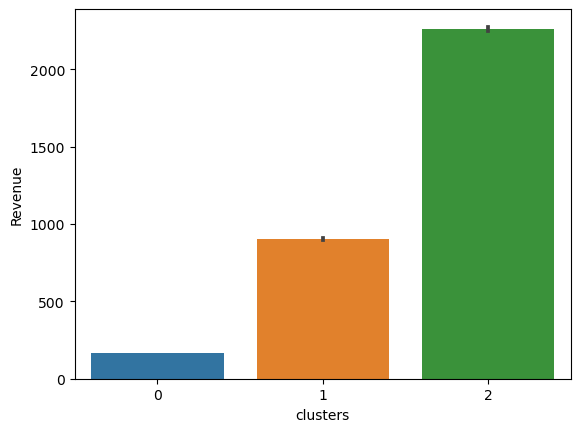

In [18]:
#Creating scatter plot of Customer Age and Revenue

sns.barplot(x='clusters',y="Revenue",data=df)
plt.show()
    
fig = px.scatter(df, x="Customer Age", y="Revenue")
fig.show()

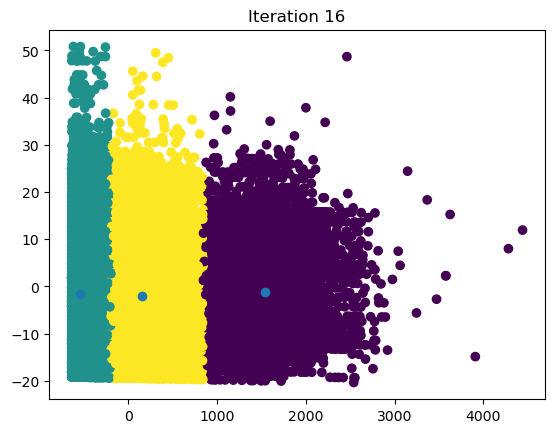

,0,1,2
Customer Age,35.782954,34.543511,34.531557
Revenue,2179.564995,97.567285,791.913032


In [19]:
#Creating cluster map with Customer Age and Revenue 

df_age_revenue = df[["Customer Age","Revenue"]]

def random_centroids(data, k):
    centroids = []
    for i in range(k):
        centroid = data.apply(lambda x: float(x.sample()))
        centroids.append(centroid)
    return pd.concat(centroids, axis=1)

centroids = random_centroids(df_age_revenue, 3)
centroids

def get_labels(data, centroids):
    distances = centroids.apply(lambda x: np.sqrt(((data - x) ** 2).sum(axis=1)))
    return distances.idxmin(axis=1)

labels = get_labels(df_age_revenue, centroids)

labels.value_counts()

def new_centroids(data, labels, k):
    centroids = data.groupby(labels).apply(lambda x: np.exp(np.log(x).mean())).T
    return centroids

def plot_clusters(data, labels, centroids, iteration):
    pca = PCA(n_components=2)
    data_2d = pca.fit_transform(data)
    centroids_2d = pca.transform(centroids.T)
    clear_output(wait=True)
    plt.title(f'Iteration {iteration}')
    plt.scatter(x=data_2d[:,0], y=data_2d[:,1], c=labels)
    plt.scatter(x=centroids_2d[:,0], y=centroids_2d[:,1])
    plt.show()
    
max_iterations = 100
centroid_count = 3

centroids = random_centroids(df_age_revenue, centroid_count)
old_centroids = pd.DataFrame()
iteration = 1

while iteration < max_iterations and not centroids.equals(old_centroids):
    old_centroids = centroids
    
    labels = get_labels(df_age_revenue, centroids)
    centroids = new_centroids(df_age_revenue, labels, centroid_count)
    plot_clusters(df_age_revenue, labels, centroids, iteration)
    iteration += 1

centroids

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 334055.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 334055.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 334055.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 334055.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 334055.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 6385, cost: 315956.0
Run 1, iteration: 2/100, moves: 52, cost: 315956.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 5506, cost: 315673.0
Run 2, iter

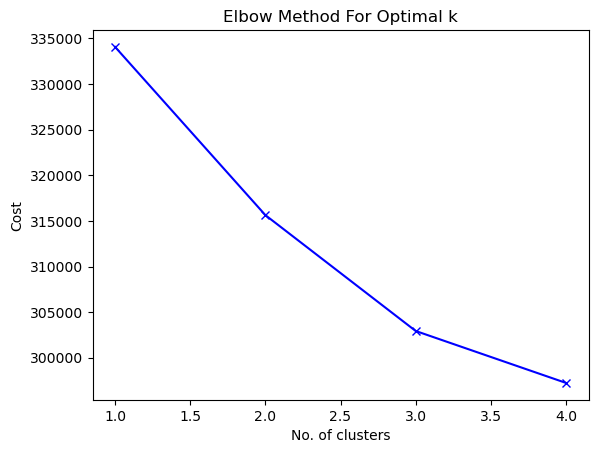

In [20]:
#Finding optimal number of clusters for Categorical Data

cost = []
K = range(1,5)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(df)
    cost.append(kmode.cost_)
    
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

In [21]:
#Training model with optimal number of clusters

kmode = KModes(n_clusters=3, init = "random", n_init = 5, verbose=1)
clusters = kmode.fit_predict(df)
clusters

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 6778, cost: 305683.0
Run 1, iteration: 2/100, moves: 669, cost: 305527.0
Run 1, iteration: 3/100, moves: 41, cost: 305527.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 9910, cost: 305918.0
Run 2, iteration: 2/100, moves: 1931, cost: 305910.0
Run 2, iteration: 3/100, moves: 3, cost: 305910.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 6920, cost: 305982.0
Run 3, iteration: 2/100, moves: 38, cost: 305982.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 4569, cost: 309708.0
Run 4, iteration: 2/100, moves: 2784, cost: 307477.0
Run 4, iteration: 3/100, moves: 4640, cost: 306063.0
Run 4, iteration: 4/100, moves: 605, cost: 306063.0
Init: initializing centroids
Init: initializing clust

array([0, 1, 2, ..., 0, 1, 0], dtype=uint16)

In [22]:
#adding cluster to categorical data table

df.insert(0, "Cluster", clusters, True)
df.head()

,Cluster,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue,clusters
0,0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,1.0,80.00,109.000000,80.0,109.0,0
1,1,February,29.0,F,United States,Washington,Clothing,Gloves,2.0,24.50,28.500000,49.0,57.0,0
2,2,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,3.67,5.000000,11.0,15.0,0
3,2,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,2.0,87.50,116.500000,175.0,233.0,0
4,1,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,35.00,41.666667,105.0,125.0,0


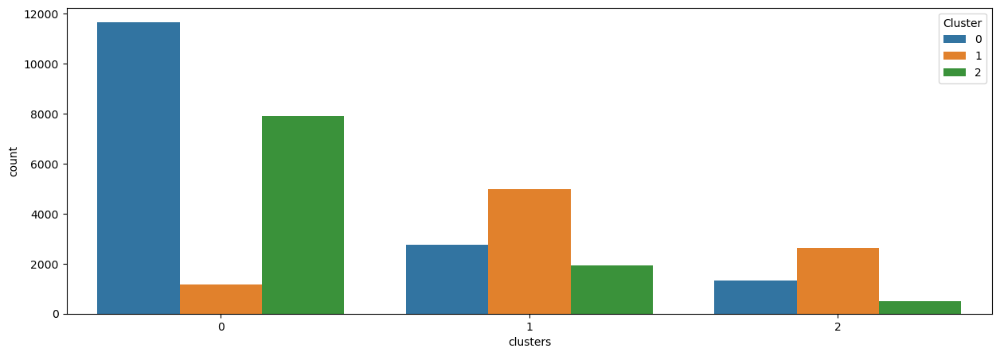

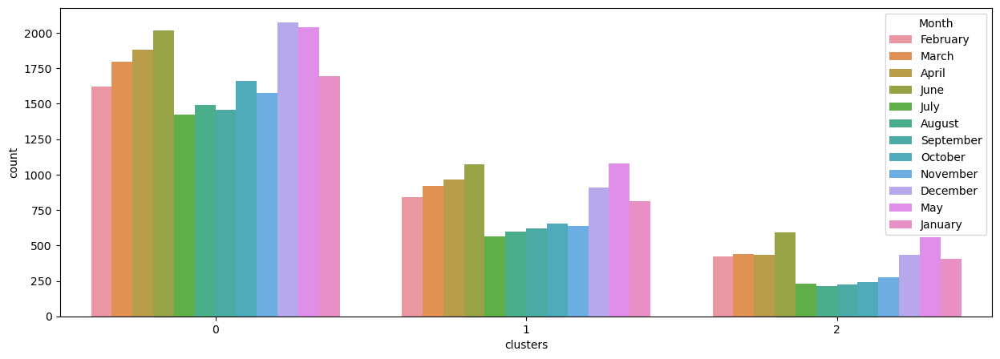

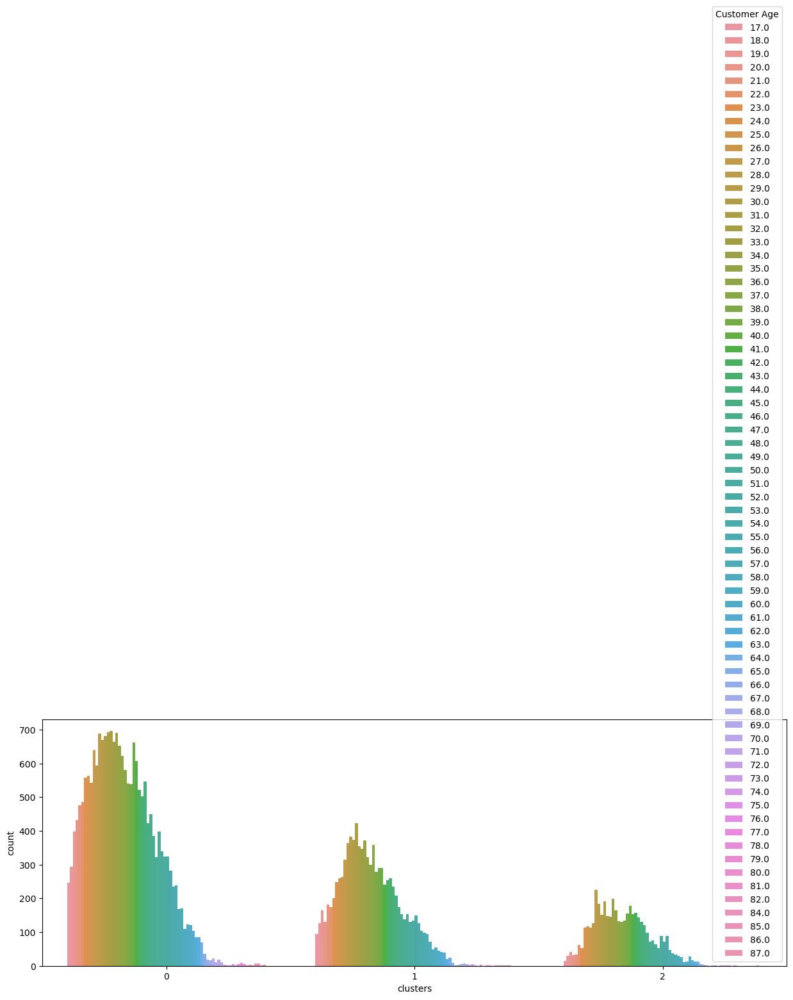

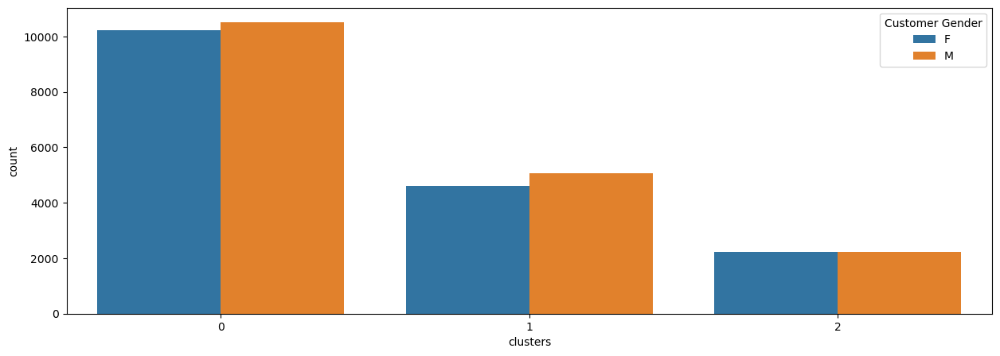

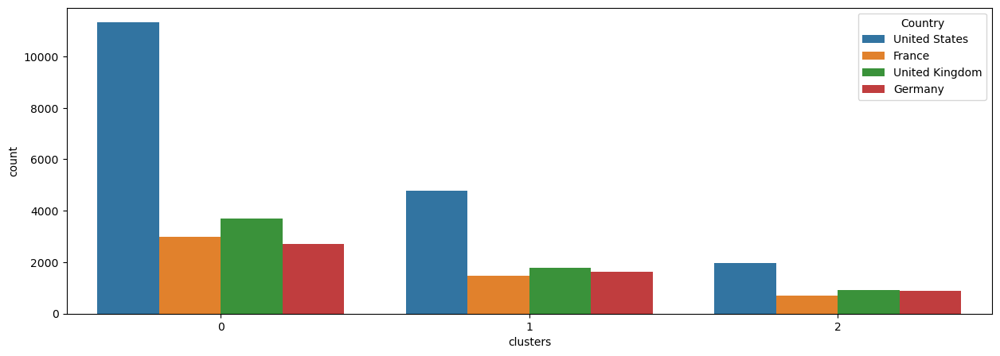

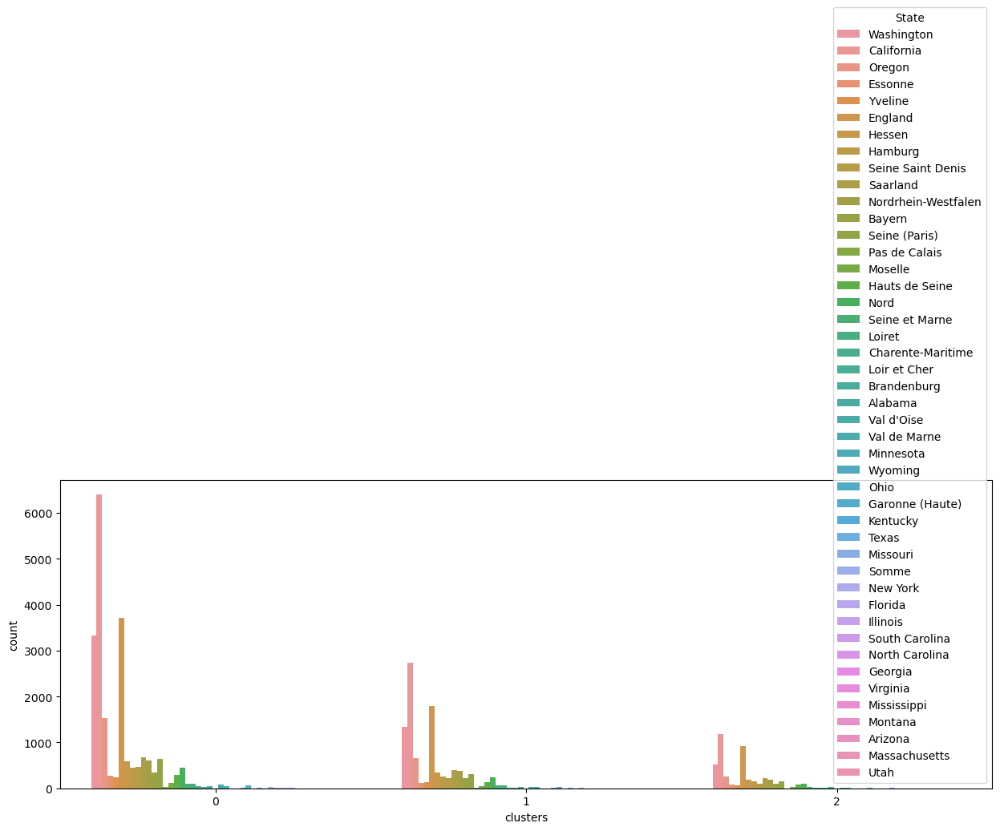

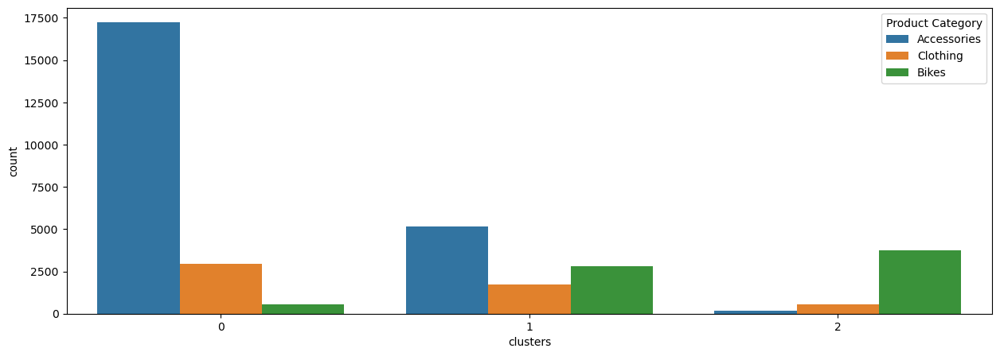

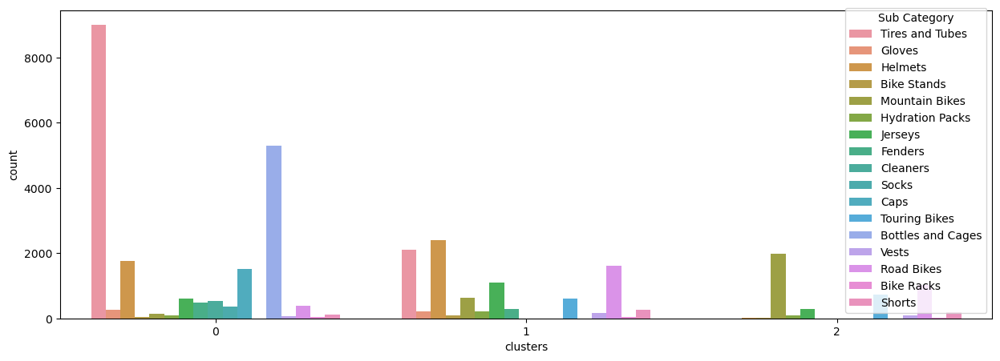

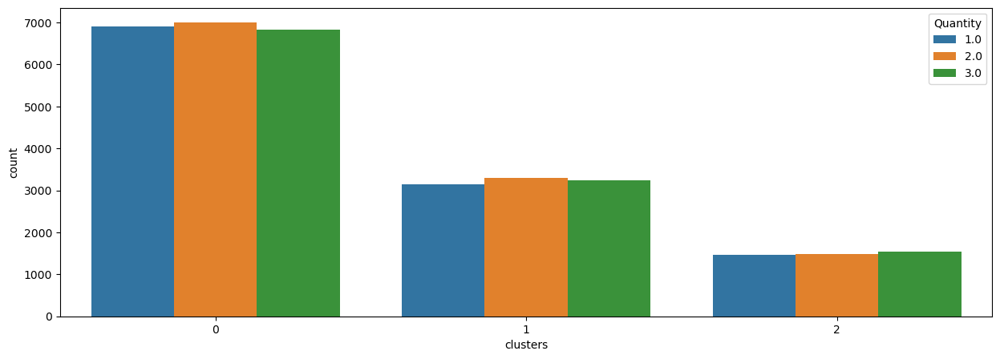

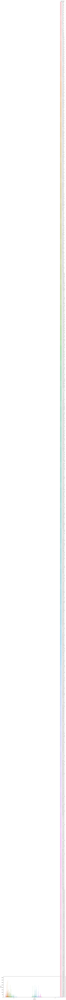

ValueError: Image size of 1238x108482 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1500x500 with 1 Axes>

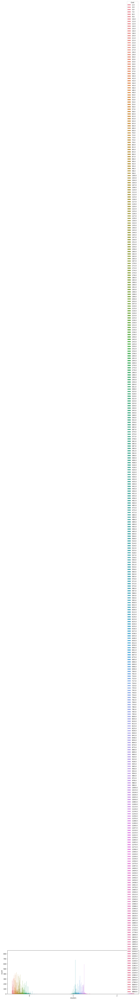

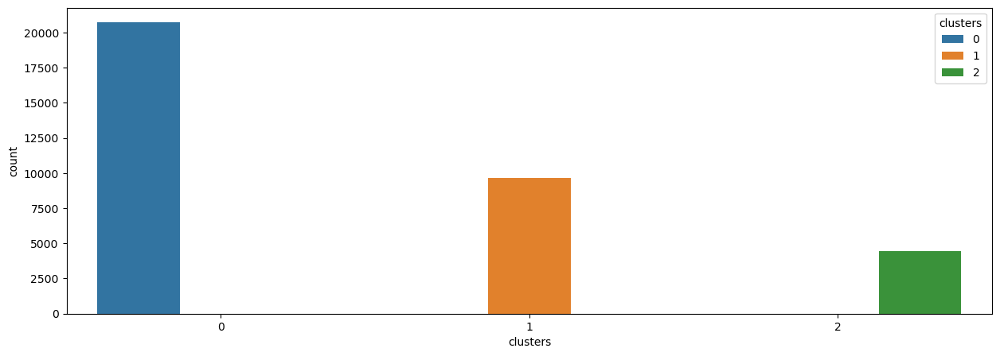

In [23]:
#making bar charts for clusters in each category

for col in df:
    plt.subplots(figsize = (15,5))
    sns.countplot(x='clusters',hue=col, data = df)
    plt.show()